---

# Web & Commerce Analytics Case Study
Harikrishnan Gopalakrishnan
### Task 1 : Customer Segmentation

---

<b>Objective :<br>
    
-Based on the available dataset,the main objective is to segment the customers according to the purchase behaviour.

This notebook follows the structure: 
1. Importing the Libraries
2. Loading Data
3. Data Pre-Processing(i.)  
4. Data Preparation
5. Explanatory Data analysis(EDA) 
   - (ii.)Patterns and (iii.)Determing the Products and categories the customers are most interested 
6. Customer segmentation
   - Approach : Product Based Clustering
     - PCA
     - K-Means
   - Approach : Purchasing behaviour based Clustering(iv.) 
     - PCA
     - K-Means
7. Additional Analysis(v.)

Note:The Roman letters (i.)-(v.) represents the questions asked in the case study


## 1.Importing the Libraries

In [314]:
# Data exploration
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

#Data Pre-Processing
import pandas as pd
import numpy as np
from sklearn.preprocessing import OrdinalEncoder
from sklearn.feature_selection import  VarianceThreshold
from sklearn.preprocessing import MinMaxScaler

#Modeling
from sklearn.model_selection import KFold, GridSearchCV
from yellowbrick.cluster import KElbowVisualizer
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing


# Show all columns
pd.set_option('display.max_columns', None)

# 2.Load the data

In [2]:
#read the data
dept = pd.read_csv('./data/departments.csv')
prod = pd.read_csv('./data/products.csv')
orders = pd.read_csv('./data/orders.csv') 
order_p = pd.read_csv('./data/order_products.csv')

In [3]:
#shape of the above data
print('The shape of the departments data is',dept.shape)
print('The shape of the products data is',prod.shape)
print('The shape of the orders data is',orders.shape)
print('The shape of the orders-products data is',order_p.shape)

The shape of the departments data is (21, 2)
The shape of the products data is (134, 3)
The shape of the orders data is (200000, 6)
The shape of the orders-products data is (2019501, 4)


# 3.Data Pre-processing

<b>1.Departments table

In [4]:
dept.head(5)

,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol


In [5]:
dept.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21 entries, 0 to 20
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   department_id  21 non-null     int64 
 1   department     21 non-null     object
dtypes: int64(1), object(1)
memory usage: 464.0+ bytes


In [6]:
dept.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
department_id,21.0,11.0,6.204837,1.0,6.0,11.0,16.0,21.0


In [7]:
dept.isna().sum()

department_id    0
department       0
dtype: int64

<b>2.Products Table

In [8]:
prod.head(5)

,product_id,department_id,product_name
0,61,19,cookies cakes
1,104,13,spices seasonings
2,94,7,tea
3,38,1,frozen meals
4,5,13,marinades meat preparation


In [9]:
prod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134 entries, 0 to 133
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   product_id     134 non-null    int64 
 1   department_id  134 non-null    int64 
 2   product_name   134 non-null    object
dtypes: int64(2), object(1)
memory usage: 3.3+ KB


In [10]:
prod.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
product_id,134.0,67.500000,38.826537,1.0,34.25,67.5,100.75,134.0
department_id,134.0,11.373134,5.726435,1.0,7.00,12.0,16.00,21.0


In [11]:
prod.isna().sum()

product_id       0
department_id    0
product_name     0
dtype: int64

<b>3.Orders table

In [12]:
orders.head(5)

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2425083,49125,1,2,18,NaN
1,1944304,162867,1,3,17,NaN
2,1201011,147243,14,0,16,3.0
3,1906860,195275,81,1,11,3.0
4,2766469,58222,3,6,11,6.0


In [13]:
#datatype info
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 6 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   order_id                200000 non-null  int64  
 1   user_id                 200000 non-null  int64  
 2   order_number            200000 non-null  int64  
 3   order_dow               200000 non-null  int64  
 4   order_hour_of_day       200000 non-null  int64  
 5   days_since_prior_order  187746 non-null  float64
dtypes: float64(1), int64(5)
memory usage: 9.2 MB


In [14]:
#description
orders.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
order_id,200000.0,1.710075e+06,987643.679421,10.0,853275.75,1709227.0,2563077.25,3421080.0
user_id,200000.0,1.031503e+05,59603.839560,2.0,51541.00,102829.0,154731.50,206209.0
order_number,200000.0,1.714468e+01,17.701549,1.0,5.00,11.0,23.00,100.0
order_dow,200000.0,2.775845e+00,2.044984,0.0,1.00,3.0,5.00,6.0
order_hour_of_day,200000.0,1.345863e+01,4.220867,0.0,10.00,13.0,16.00,23.0
days_since_prior_order,187746.0,1.099999e+01,9.147087,0.0,4.00,7.0,15.00,30.0


In [15]:
#null values
orders.isna().sum()

order_id                      0
user_id                       0
order_number                  0
order_dow                     0
order_hour_of_day             0
days_since_prior_order    12254
dtype: int64

In [16]:
#Unique values of the orders table
for col in orders:
    print("The unique count of",col,orders[col].nunique())

The unique count of order_id 200000
The unique count of user_id 105273
The unique count of order_number 100
The unique count of order_dow 7
The unique count of order_hour_of_day 24
The unique count of days_since_prior_order 31


In [17]:
#get the percentage of missing values-orders
percent_missing = orders.isnull().sum() * 100 / len(orders)
missing_value_df = pd.DataFrame({'column_name': orders.columns,
                                 'percent_missing': percent_missing})
missing_value_df

,column_name,percent_missing
order_id,order_id,0.000
user_id,user_id,0.000
order_number,order_number,0.000
order_dow,order_dow,0.000
order_hour_of_day,order_hour_of_day,0.000
days_since_prior_order,days_since_prior_order,6.127


<b>6.1% of the overall observations in the variable-days_since_last_order has null values.It will be replaced with the appropiate statistic measures in the subsequent process

In [18]:
orders.columns

Index(['order_id', 'user_id', 'order_number', 'order_dow', 'order_hour_of_day',
       'days_since_prior_order'],
      dtype='object')

In [19]:
#Outliers
fig = go.Figure()

for col in ['order_dow', 'order_hour_of_day',
       'days_since_prior_order'
       ]:
    fig.add_trace(go.Box(x=orders[col], name=col))
fig.show()


The Variables 'order_dow', 'order_hour_of_day' and 'days_since_prior_order' does not have any outliers.

<b>4.orders-products table

In [20]:
order_p.head(5)

,order_id,product_id,add_to_cart_order,reordered
0,10,24,1,1
1,10,83,2,1
2,10,16,3,0
3,10,24,4,1
4,10,83,5,1


In [21]:
order_p.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2019501 entries, 0 to 2019500
Data columns (total 4 columns):
 #   Column             Dtype
---  ------             -----
 0   order_id           int64
 1   product_id         int64
 2   add_to_cart_order  int64
 3   reordered          int64
dtypes: int64(4)
memory usage: 61.6 MB


In [22]:
order_p.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
order_id,2019501.0,1.707013e+06,985983.196234,10.0,852649.0,1705004.0,2559031.0,3421080.0
product_id,2019501.0,7.120590e+01,38.207275,1.0,31.0,83.0,107.0,134.0
add_to_cart_order,2019501.0,8.363173e+00,7.150059,1.0,3.0,6.0,11.0,137.0
reordered,2019501.0,5.897427e-01,0.491880,0.0,0.0,1.0,1.0,1.0


In [23]:
order_p.isna().sum()

order_id             0
product_id           0
add_to_cart_order    0
reordered            0
dtype: int64

In [24]:
for col in order_p:
    print("The unique count of",col,order_p[col].nunique())

The unique count of order_id 200000
The unique count of product_id 134
The unique count of add_to_cart_order 137
The unique count of reordered 2


C:\tools\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



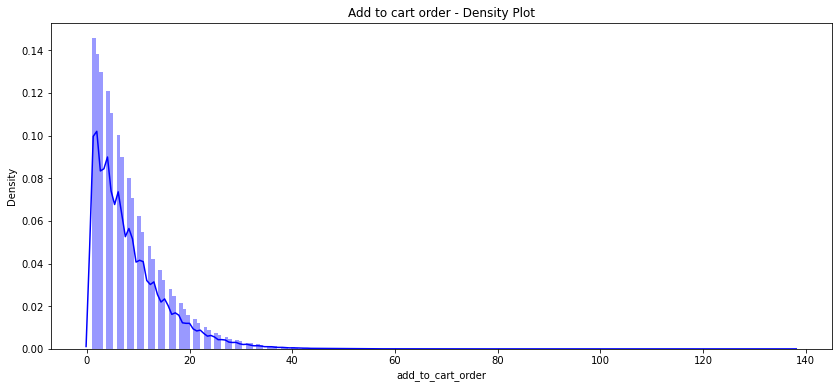

In [25]:
#Distribution of Add to cart order
plt.figure(figsize = (14,6))
plt.title('Add to cart order - Density Plot')
sns.set_color_codes("pastel")
sns.distplot(order_p["add_to_cart_order"],kde=True,bins=200, color="blue")
plt.show()

From the above density plot ,it can observed that many orders contain products ranging from 0 to 20 and only few orders have product quantity more than 20 in their cart

## 4.Data Preparation

<b>It can be observed that for every user’s 1st order ( order_number = 1) the days_since_prior_order is Nan(null value).So,We can impute 0 here

In [28]:
#Replace the na values with zero 
orders['days_since_prior_order'] = orders['days_since_prior_order'].fillna(0)

In [29]:
#Check 
orders.isna().sum()

order_id                  0
user_id                   0
order_number              0
order_dow                 0
order_hour_of_day         0
days_since_prior_order    0
dtype: int64

In [30]:
#create the varibale time period - Morning,Afternoon,Evening,Night
filters = [
   (orders.order_hour_of_day > 22) & (orders.order_hour_of_day <= 6 ),
   (orders.order_hour_of_day > 6) & (orders.order_hour_of_day <= 12),
    (orders.order_hour_of_day > 12) & (orders.order_hour_of_day <= 17),
    (orders.order_hour_of_day > 17) & (orders.order_hour_of_day <= 22)
]
values = ["Night", "Morning", "Afternoon","Evening"]

In [32]:
orders["Time Period"] = np.select(filters, values,default="Night")
orders.head()

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,Time Period
0,2425083,49125,1,2,18,0.0,Evening
1,1944304,162867,1,3,17,0.0,Afternoon
2,1201011,147243,14,0,16,3.0,Afternoon
3,1906860,195275,81,1,11,3.0,Morning
4,2766469,58222,3,6,11,6.0,Morning


In [33]:
#replace the na values with 0
#ord_2['days_since_prior_order'].fillna(ord_2['days_since_prior_order'].mode()[0], inplace=True)
#df['column'].fillna(df['column'].mode()[0], inplace=True)

In [34]:
orders['Time Period'].value_counts()

Morning      80385
Afternoon    78567
Evening      33312
Night         7736
Name: Time Period, dtype: int64

In [35]:
orders.head()

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,Time Period
0,2425083,49125,1,2,18,0.0,Evening
1,1944304,162867,1,3,17,0.0,Afternoon
2,1201011,147243,14,0,16,3.0,Afternoon
3,1906860,195275,81,1,11,3.0,Morning
4,2766469,58222,3,6,11,6.0,Morning


#### Merging the tables

In [39]:
#Merge the tables
df1 = pd.merge(dept, prod, how='right', on='department_id')
df1 = pd.merge(df1,order_p,how='right',on='product_id')
df1 = pd.merge(df1,orders,how='left',on='order_id')
df1 = df1.sort_values(by=['order_id']).reset_index(drop=True)

cols = ['user_id','order_id','product_id','department_id','add_to_cart_order',
       'reordered','product_name','department','order_number','order_dow','order_hour_of_day',
       'days_since_prior_order','Time Period']

df1 = df1[cols]

df1.head()

,user_id,order_id,product_id,department_id,add_to_cart_order,reordered,product_name,department,order_number,order_dow,order_hour_of_day,days_since_prior_order,Time Period
0,135442,10,24,4,1,1,fresh fruits,produce,4,6,8,8.0,Morning
1,135442,10,83,4,15,0,fresh vegetables,produce,4,6,8,8.0,Morning
2,135442,10,122,12,13,0,meat counter,meat seafood,4,6,8,8.0,Morning
3,135442,10,53,16,12,1,cream,dairy eggs,4,6,8,8.0,Morning
4,135442,10,83,4,11,0,fresh vegetables,produce,4,6,8,8.0,Morning


# 5.Explanatory Data Analysis

## ii.Patterns and iii.Determing the Products and categories the customers are most interested 

### Number of orders placed by every user

In [70]:
count_ord = orders.groupby(['user_id'])['order_id'].agg(lambda group: len(group.unique()))\
            .reset_index(name='orders_count')\
            .set_index('user_id')

In [71]:
print("Minimum orders per user :",count_ord['orders_count'].min())
print("Maximum orders per user :",count_ord['orders_count'].max())

Minimum orders per user : 1
Maximum orders per user : 15


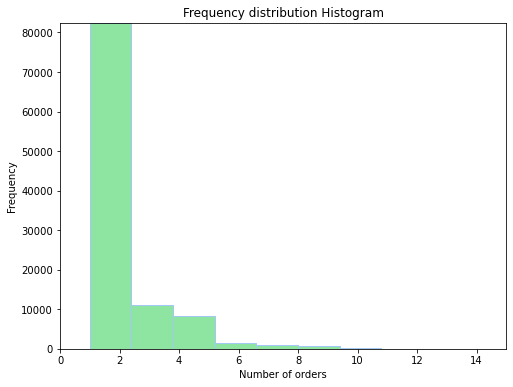

In [78]:
# Plot frequency distribution using histogram

import matplotlib.pyplot as plot

import numpy as np

plt.figure(figsize=(8, 6))
plot.hist(count_ord['orders_count'], facecolor="g", edgecolor='b')

plot.title("Frequency distribution Histogram")

plot.margins(0)

plt.xlabel("Number of orders")
plt.ylabel("Frequency")

plot.xticks(range(0,15,2))

# Display the histogram

plot.show()

If all the users in the data are considered ,it is observed that we have orders ranfing from 1 to 15.<br>
The above histogram plot shows that there are few users who placed order more than 6.<br>
The minimum and maximum order for any user is 1 and 15 respectively.

### Proportion and reordered and non-reordered products

- proportion and reordered and non-reordered products

In [80]:
df1.reordered.value_counts()

1    1190986
0     828515
Name: reordered, dtype: int64

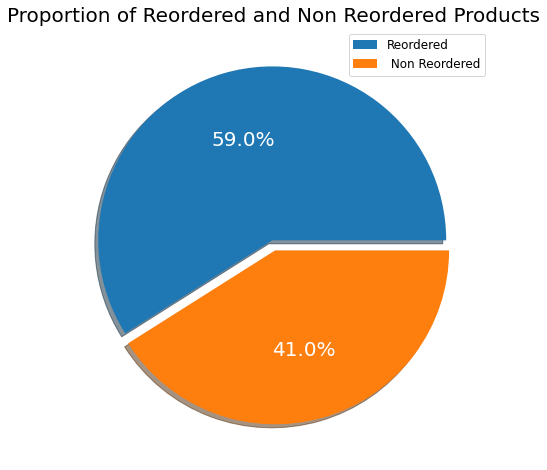

In [120]:
#plot to show the proportion and reordered and non-reordered products
plt.subplots(figsize=(8, 8))
plt.pie(df1.reordered.value_counts(), shadow=True, explode=[.03,.03], autopct='%1.1f%%', textprops={'fontsize': 20, 'color': 'white'})
plt.title('Proportion of Reordered and Non Reordered Products', size=20)
plt.legend(['Reordered', ' Non Reordered'], loc='best', fontsize=12)
plt.show()

From overall products ordered,we can notice from the above pie chat that 59% are reordered products and 41% are non reordered products by the user.

### Products with high percentage of reorders

In [139]:
#Frequently reordered products
oc = df1.groupby(['product_name'])['reordered'].sum().reset_index(name='reorder counts')
df2 = df1
df2['ordered'] = np.where(df1['reordered']== 0, 1, 0)
oc2 = df2.groupby(['product_name'])['ordered'].sum().reset_index(name='non reorder counts')


oc['non reorder counts'] = oc2['non reorder counts']
oc['Percentage']=oc['reorder counts']/(oc['reorder counts']+oc['non reorder counts'])
oc = oc.sort_values('Percentage',ascending=False)
oc.head()


,product_name,reorder counts,non reorder counts,Percentage
83,milk,43162,11988,0.782629
131,water seltzer sparkling water,38467,14097,0.731813
50,fresh fruits,162355,63684,0.718261
41,eggs,19798,8188,0.707425
119,soy lactosefree,27251,12138,0.691843


In [153]:
#Bar graph to show the products with high percentage of reorders
oc = oc.head(10)
fig = px.bar(oc, x='product_name', y='Percentage',width=None)
fig.show()

From the above bar graph,we can observe the top 10 products with highest percentage or reorders.The customers are highly interested in the products such as milk,water seltzer sparkling water ,fresh fruits and eggs etc.

In [150]:
#Products with maximum reorders
oc1=oc[['product_name','reorder counts']].sort_values('reorder counts',ascending=False)
oc1.head(10)

,product_name,reorder counts
50,fresh fruits,162355
133,yogurt,62464
83,milk,43162
131,water seltzer sparkling water,38467
119,soy lactosefree,27251
11,bread,24540
110,refrigerated,23854
41,eggs,19798
33,cream,13625
96,packaged produce,12021


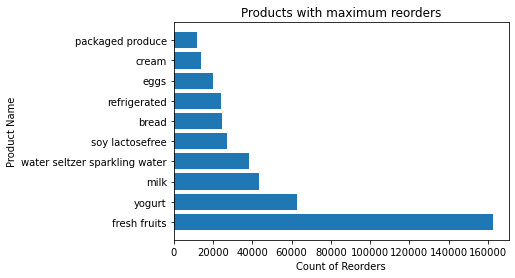

In [152]:
#plot with Products with maximum reorders
plt.barh(oc1['product_name'],oc1['reorder counts'])
plt.title('Products with maximum reorders')
plt.ylabel('Product Name')
plt.xlabel('Count of Reorders')
plt.show()

The above plot shows the product with maximum reorders.the products are more or less same when compared to Products with highest reorder percentage

#### Relation between the add to cart postion and the reorder ratio of that product

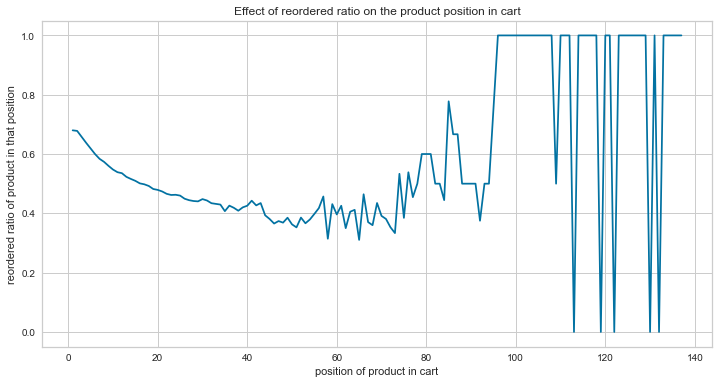

In [449]:
# Relation between the add to cart postion and the reorder ratio of that product
reord_1 = order_p.groupby(['add_to_cart_order']).agg({'reordered':'mean'}).rename(columns={'reordered':'reordered_ratio'}).reset_index()
sns.lineplot(x=reord_1['add_to_cart_order'], y=reord_1['reordered_ratio'], palette=colors)
plt.title('Effect of reordered ratio to the product position in cart')
plt.xlabel('position of product in cart')
plt.ylabel('reordered ratio to the product in that position')
plt.show()

The above distribution doesnt have any increasing or decreasing uniform pattern. It can be observed that few cases where the products that are ordered at end before the checkout i.e after 90th position in cart are reordered when compared to products added to cart at first. 

#### Product Popularity

In [155]:
#Product Popularity in terms of overall purchases-Frequency of the product 
prod_1=df1['product_name'].value_counts()
prod_1= pd.DataFrame(prod_1)
prod_1= prod_1.reset_index()
prod_1 = prod_1.rename(columns={'index': 'Product', 'product_name': 'count'})

prod_1.head(20)

,Product,count
0,fresh fruits,226039
1,fresh vegetables,212611
2,packaged vegetables fruits,109596
3,yogurt,90751
4,packaged cheese,61502
5,milk,55150
6,water seltzer sparkling water,52564
7,chips pretzels,45306
8,soy lactosefree,39389
9,bread,36381


In [156]:
# Reference
# https://stackoverflow.com/questions/43214978/seaborn-barplot-displaying-values

def show_values_on_bars(axs, h_v="v", space=0.4):
    def _show_on_single_plot(ax):
        if h_v == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height()
                value = int(p.get_height())
                ax.text(_x, _y, value, ha="center") 
        elif h_v == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height()
                value = int(p.get_width())
                ax.text(_x, _y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _show_on_single_plot(ax)
    else:
        _show_on_single_plot(axs)

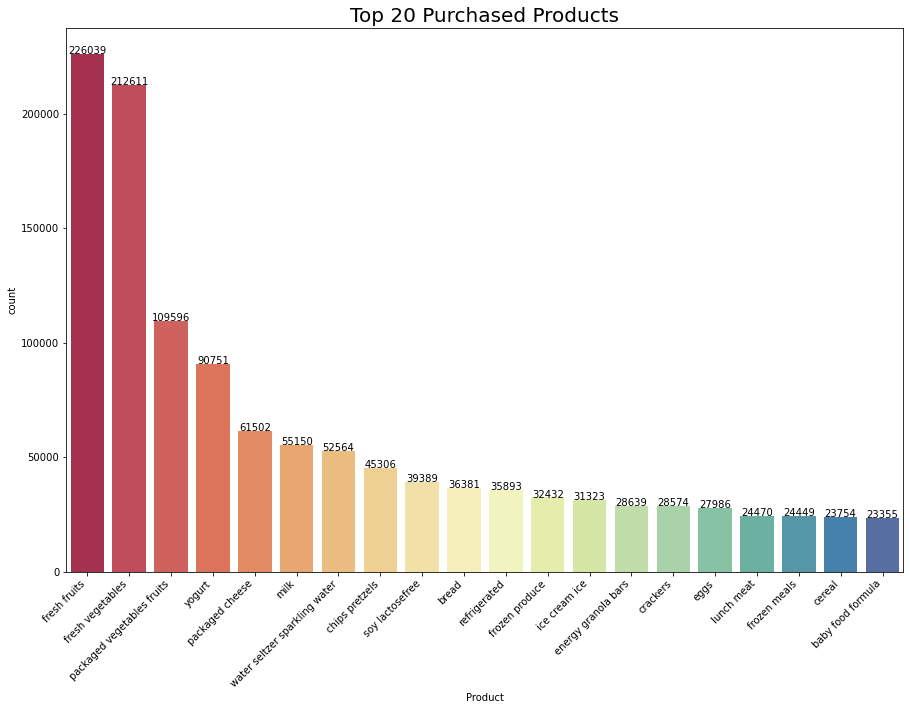

In [157]:
# Top 20 Purchased Products

fig, ax = plt.subplots(figsize = (15,10))

#prod_1=df3['product_name'].value_counts()
prod_1 = prod_1.head(20)


ax = sns.barplot(x="Product", y= "count", data = prod_1, palette ="Spectral", ci = None) 

plt.title('Top 20 Purchased Products', fontsize = 20)
plt.xticks(rotation=45, ha='right')

show_values_on_bars(ax)

From the above bar graph,we can observe the top 15 products with highest orders.The customers are highly interested in the products such as fresh fruits,fresh vegetables,packaged vegetable fruits and yogurt etc.This is due to the fact that these essential products have very short shelf life.

#### Department popularity

In [158]:
#Department Popularity in terms of overall purchases-Frequency of the Department
dept_1=df1['department'].value_counts()
dept_1= pd.DataFrame(dept_1)
dept_1= dept_1.reset_index()
dept_1 = dept_1.rename(columns={'index': 'Departments', 'department': 'count'})

dept_1.head(10)

,Departments,count
0,produce,588996
1,dairy eggs,336915
2,snacks,180692
3,beverages,168126
4,frozen,139536
5,pantry,116262
6,bakery,72983
7,canned goods,66053
8,deli,65176
9,dry goods pasta,54054


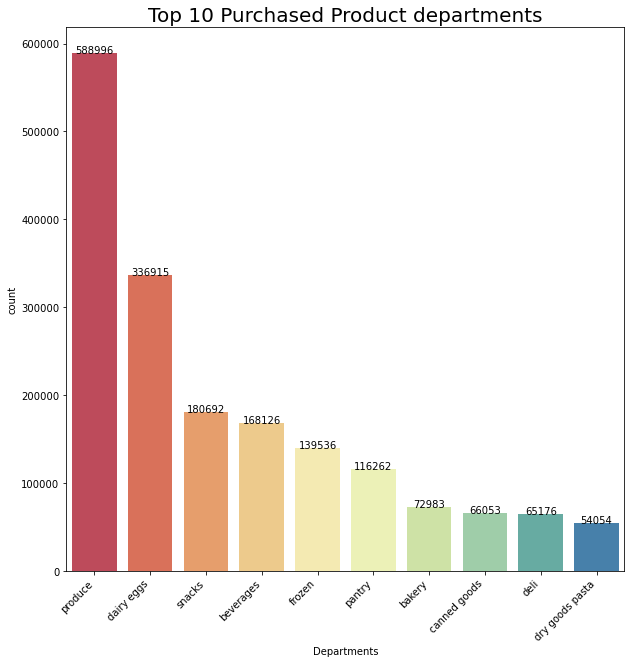

In [159]:
# Top 10 Purchased Product departments

fig, ax = plt.subplots(figsize = (10,10))

#prod_1=df3['product_name'].value_counts()
dept_1 = dept_1.head(10)


ax = sns.barplot(x="Departments", y= "count", data = dept_1, palette ="Spectral", ci = None) 

plt.title('Top 10 Purchased Product departments', fontsize = 20)
plt.xticks(rotation=45, ha='right')

show_values_on_bars(ax)

From the above bar graph,we can observe the top 10 departments with highest orders.The customers are highly interested in the product departments such as produce,dairy eggs and snacks.The highest ordered products are from these departments

#### Number of orders Grouped by Weekday

In [86]:
df1.groupby('order_dow')['order_id'].nunique()

order_dow
0    35078
1    34348
2    27277
3    25670
4    24974
5    26557
6    26096
Name: order_id, dtype: int64

In [89]:
#Weekday orders
wk_1=df1.groupby('order_dow')['order_id'].nunique()
wk_1= pd.DataFrame(wk_1)
#wk_1= wk_1.reset_index()
#wk_1 = wk_1.rename(columns={'index': 'Departments', 'department': 'count'})
wk_1= wk_1.reindex([0,1,2,3,4,5,6])
wk_1= wk_1.reset_index()
wk_1 = wk_1.rename(columns={'order_dow': 'Day of the week', 'order_id': 'Number of orders'})
wk_1

,Day of the week,Number of orders
0,0,35078
1,1,34348
2,2,27277
3,3,25670
4,4,24974
5,5,26557
6,6,26096


In [446]:
#Number of orders Grouped by Weekday
Day_of_the_week=wk_1['Day of the week']
Number_of_orders=wk_1['Number of orders']
fig = go.Figure()

fig.add_trace(go.Scatter(x=Day_of_the_week, y=Number_of_orders,
                    mode='lines+markers',
                    name='lines+markers'
                 ))
fig.update_layout(title_text='Order weekday vs Number of orders')
fig.show()

From the above plot,It can be noticed that during the day 0,day 1 the order placed are very high and shows the decresing pattern in the other days.The dow 0 and 1 are saturday and sunday,so the product purchased are high on weekends and less on weekdays

#### Number of orders Grouped by order_hour_of_day

In [92]:
df1.groupby('order_hour_of_day')['order_id'].nunique()

order_hour_of_day
0      1311
1       719
2       429
3       287
4       330
5       555
6      1803
7      5310
8     10294
9     14989
10    17102
11    16748
12    15942
13    16189
14    16600
15    16649
16    15928
17    13201
18    10716
19     8164
20     6209
21     4492
22     3731
23     2302
Name: order_id, dtype: int64

In [93]:
#Weekday orders
hour_1=df1.groupby('order_hour_of_day')['order_id'].nunique()
hour_1= pd.DataFrame(hour_1)

hour_1= hour_1.reset_index()
hour_1 = hour_1.rename(columns={'order_hour_of_day': 'Hours', 'order_id': 'Number of orders'})
hour_1

,Hours,Number of orders
0,0,1311
1,1,719
2,2,429
3,3,287
4,4,330
5,5,555
6,6,1803
7,7,5310
8,8,10294
9,9,14989


In [445]:
#Plot-Number of orders Grouped by order_hour_of_day
fig = go.Figure()
fig.add_trace(go.Scatter(x=hour_1['Hours'], y=hour_1['Number of orders'],
                    mode='lines+markers',
                    name='lines+markers'))
fig.update_layout(title_text='Order hour of day vs Number of orders')
fig.show()


From the above plot,we see that hour 10h-16h .i.e 10am to 2pm are considered as peak hours for shopping as more purchases are done specially on this time duration

<b>Number of orders Grouped by Time period

In [95]:
orders['Time Period'].value_counts()

Morning      80385
Afternoon    78567
Evening      33312
Night         7736
Name: Time Period, dtype: int64

In [96]:
tp_1 = df1.groupby('Time Period')['order_id'].nunique()
tp_1= pd.DataFrame(tp_1)

tp_1= tp_1.reset_index()
tp_1 = tp_1.rename(columns={ 'order_id': 'Number of orders'})
tp_1

,Time Period,Number of orders
0,Afternoon,78567
1,Evening,33312
2,Morning,80385
3,Night,7736


In [97]:
import plotly.graph_objects as go

colors = ['lightslategray',] * 5
colors[2] = 'crimson'

fig = go.Figure(data=[go.Bar(
    x=tp_1['Time Period'],
    y=tp_1['Number of orders'],
    marker_color=colors # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Most Ordered Time period')

Just like the previous case ,the above plot suggests that most of the orders are purchased on morning and afternoon time period

#### count of orders in each day with each hour

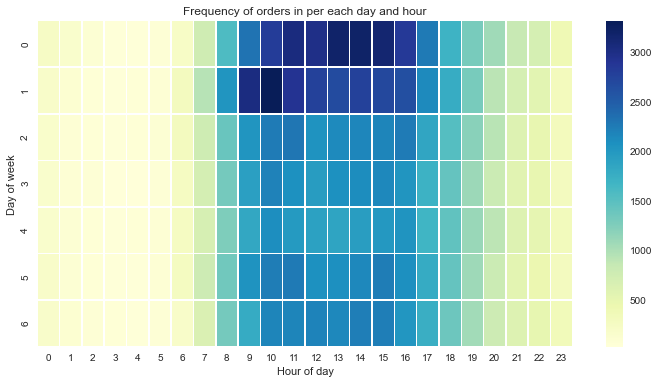

In [447]:
# Heatmap of the count of orders in each day with each hour
grouped_df = orders.groupby(['order_dow', 'order_hour_of_day'])['order_id'].agg('count').reset_index().rename(columns={'order_id':'orders_count'})
heatmap_data = grouped_df.pivot('order_dow', 'order_hour_of_day', 'orders_count')

ax = sns.heatmap(data=heatmap_data, cmap="YlGnBu", linewidths=.5)
plt.title('Frequency of orders in per each day and hour')
plt.ylabel('Day of week')
plt.xlabel('Hour of day')
plt.show()

#### Inferences:
      -Most products are ordered and reordered from the Produce department,These products are perishable and essential food items which    has short shelf life.
      
      -Orders are mostly placed during  from 10:00 AM to 4:00 PM.This is considered as peak time.
      
      -Most orders are placed on Day 0 and Day 1(Saturday and sunday)
      
      -Reorder items are mostly added at last in the cart.
      

# 6.Customer Segmentation


Customer segmentation is done by clustering both product based and customer behaviour seperately.

### Approach : Product Based Clustering

In [179]:
#libraries
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing

There are 134 products in the dataset.Since the features are high in the products, Principal Component Analysis is used to reduce the dimensions which in turn makes clustering better and easy.

In [162]:
#creating the dataframe to show the products purchased by user in every row
df_new = pd.crosstab(df1.user_id, df1.product_name)
df_new.head()

product_name,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,body lotions soap,bread,breakfast bakery,breakfast bars pastries,bulk dried fruits vegetables,bulk grains rice dried goods,buns rolls,butter,candy chocolate,canned fruit applesauce,canned jarred vegetables,canned meals beans,canned meat seafood,cat food care,cereal,chips pretzels,cleaning products,cocoa drink mixes,coffee,cold flu allergy,condiments,cookies cakes,crackers,cream,deodorants,diapers wipes,digestion,dish detergents,dog food care,doughs gelatins bake mixes,dry pasta,eggs,energy granola bars,energy sports drinks,eye ear care,facial care,feminine care,first aid,food storage,fresh dips tapenades,fresh fruits,fresh herbs,fresh pasta,fresh vegetables,frozen appetizers sides,frozen breads doughs,frozen breakfast,frozen dessert,frozen juice,frozen meals,frozen meat seafood,frozen pizza,frozen produce,frozen vegan vegetarian,fruit vegetable snacks,grains rice dried goods,granola,hair care,honeys syrups nectars,hot cereal pancake mixes,hot dogs bacon sausage,ice cream ice,ice cream toppings,indian foods,instant foods,juice nectars,kitchen supplies,kosher foods,latino foods,laundry,lunch meat,marinades meat preparation,meat counter,milk,mint gum,missing,more household,muscles joints pain relief,nuts seeds dried fruit,oils vinegars,oral hygiene,other,other creams cheeses,packaged cheese,packaged meat,packaged poultry,packaged produce,packaged seafood,packaged vegetables fruits,paper goods,pasta sauce,pickled goods olives,plates bowls cups flatware,popcorn jerky,poultry counter,prepared meals,prepared soups salads,preserved dips spreads,protein meal replacements,red wines,refrigerated,refrigerated pudding desserts,salad dressing toppings,seafood counter,shave needs,skin care,soap,soft drinks,soup broth bouillon,soy lactosefree,specialty cheeses,specialty wines champagnes,spices seasonings,spirits,spreads,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt
user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,1,1,0,0,0,0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,0,0,0,0,0,0,1,0,0
7,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,5,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,3,1,1,0,0,0,0,0,0,1,0,0,0,4,0,0,0,0,3,0,0,0,0,0,1,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
11,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,2,0,0


In [177]:
x = df_new.values #returns a numpy array
x

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 0, 1],
       ...,
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 1]], dtype=int64)

In [180]:
#Scaling the values before PCA
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_new2 = pd.DataFrame(x_scaled)

In [181]:
df_new2.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133
0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.027778,0.0,0.0,0.00,0.0,0.0,0.0,0.05,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.058824,0.049180,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.037037,0.000000,0.000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.066667,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.090909,0.000000,0.0,0.052632,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.00,0.0,0.0,0.0,0.05,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.049180,0.000000,0.0,0.000000,0.0,0.0,0.083333,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.037037,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000,0.0,0.0,0.0,0.0,0.0,0.066667,0.000000,0.0,0.0,0.1,0.033333,0.0,0.0,0.000000,0.0,0.088235,0.090909,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.088235,0.0,0.0,0.0,0.0,0.083333,0.0,0.0,0.0,0.0,0.0,0.0,0.022222,0.0,0.000000
2,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.026316,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.083333,0.0,0.090909,0.0,0.0,0.0,0.000000,0.0,0.0,0.08,0.0,0.0,0.0,0.05,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.016393,0.000000,0.0,0.011905,0.0,0.0,0.000000,0.0,0.0,0.033333,0.0,0.0,0.0,0.0,0.055556,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.111111,0.000000,0.125,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.1,0.033333,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.090909,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.108696,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.029412,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.007143
3,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.058824,0.032787,0.333333,0.0,0.035714,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.181818,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.111111,0.166667,0.125,0.0,0.0,0.0,0.0,0.0,0.000000,0.076923,0.0,0.0,0.0,0.133333,0.0,0.0,0.000000,0.0,0.088235,0.000000,0.0,0.0,0.0,0.000000,0.142857,0.0,0.000000,0.333333,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.007143
4,0.0,0.0,0.0,0.0,0.0,0.0,0.153846,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.125,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.052632,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000,0.0,0.0,0.0,0.0,0.0,0.000000,0.076923,0.0,0.0,0.0,0.000000,0.0,0.0,0.034483,0.0,0.029412,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.033333,0.0,0.000000,0.0,0.0,0.0,0.0,0.083333,0.0,0.0,0.0,0.0,0.0,0.0,0.044444,0.0,0.000000


In [182]:
df_new2.shape

(105273, 134)

### PCA(Principal Component Analysis)

Algorithms cannot effectively and efficiently train on the data because of the high dimension feature space. That kind of problem is often referred to as the curse of dimensionality.PCA is used as a Dimensionality reduction technique to help to solve the curse of dimensionality. 

It transforms a set of correlated variables (p) into a smaller k (k<p) number of uncorrelated variables called principal components while retaining as much of the variation in the original dataset as possible.

In [183]:
#PCA
pca = PCA(n_components=10)
df_pca = pca.fit_transform(df_new2)
df_pca = pd.DataFrame(df_pca)
df_pca.head()

,0,1,2,3,4,5,6,7,8,9
0,-0.051013,-0.011710,-0.023913,0.032539,-0.030306,0.016776,-0.004711,0.004833,-0.001546,-0.001325
1,0.012831,-0.047126,-0.018195,0.019020,-0.021893,0.060695,0.049512,-0.048714,0.009856,0.015584
2,-0.005155,-0.022381,-0.028373,-0.018972,-0.056823,-0.001871,0.060042,-0.040536,-0.008096,-0.018629
3,0.141156,0.118620,-0.085927,-0.069506,-0.025495,-0.095963,0.017108,0.199348,0.286289,0.064776
4,-0.022004,0.004301,0.136540,-0.045891,-0.032253,0.052403,-0.034170,0.049290,-0.004878,-0.028288


n_components=10 states that 10 principal components preserves 95% of the variability in the data. The pca array holds the values of all 10 principal components.

### K-Means Clustering

clustering is the task of grouping a set of objects in such a way that objects in the same group (called a cluster) are more similar (in some sense) to each other than to those in other groups (clusters).

K-means clustering aims to partition data into k clusters in a way that data points in the same cluster are similar and data points in the different clusters are farther apart.

In our business problem,Euclidean distance is used as distance measurement approach.

In [184]:
Sum_of_squared_distances = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(df_pca)
    Sum_of_squared_distances.append(km.inertia_)

#### Choose the value of K

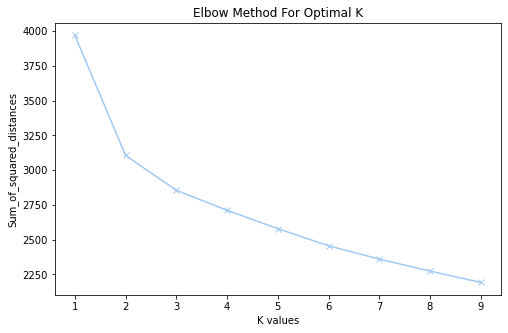

In [186]:
#elbow plot
plt.subplots(figsize = (8, 5))
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('K values')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal K')
plt.show()

From the above the plot ,the optimal K value is selected as K = 4

In [187]:
clust = KMeans(n_clusters=4,random_state=42).fit(df_pca)
centers = clust.cluster_centers_
c_preds = clust.predict(df_pca)
print(centers)

[[ 5.80562392e-02 -1.75348608e-02 -5.50168666e-02 -3.10399490e-02
  -3.15368783e-02 -2.33884691e-02  5.88869192e-02  1.41987513e-01
   3.91681405e-02  3.62087537e-02]
 [-5.60447066e-02 -4.09133456e-05  4.84947872e-04  1.30478223e-03
  -1.85365881e-04  9.21751194e-04 -1.54982056e-03 -4.04817299e-03
  -9.12972943e-04 -9.29309861e-04]
 [ 8.58484288e-02  2.85590272e-03  9.58699299e-03  1.12970681e-03
   8.07737094e-03  1.91854387e-03 -5.93179644e-03 -1.43254986e-02
  -4.83837899e-03 -4.39964166e-03]
 [ 3.81029684e-01  4.84461217e-03  2.39616369e-03  6.91838406e-03
  -4.47666388e-03  7.52965683e-04 -8.39387636e-03 -1.52404040e-02
  -2.89539511e-03 -1.71000047e-03]]


PCA1 and PCA2 components are chosen to plot because they have the highest explained variance.That is maximising the variance minimizes the squared error and avoid overfitting 

In [188]:
temp_df = df_pca.iloc[:, 0:2]
temp_df.columns = ["pc1", "pc2"]
temp_df['cluster'] = c_preds
temp_df.head()

<ipython-input-188-dd20da319cba>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,pc1,pc2,cluster
0,-0.051013,-0.011710,1
1,0.012831,-0.047126,1
2,-0.005155,-0.022381,1
3,0.141156,0.118620,0
4,-0.022004,0.004301,1


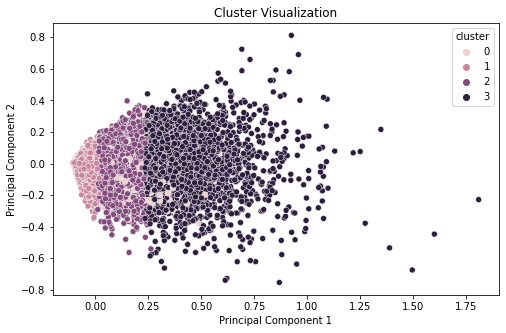

In [189]:
#Plot
fig, ax = plt.subplots(figsize = (8, 5))
ax = sns.scatterplot(data = temp_df, x = "pc1", y = "pc2", hue = "cluster")
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_title("Cluster Visualization")
plt.show();

#### Top products per cluster

In [190]:
#Add the cluster variable to the orig df df_new
df_new['cluster'] = c_preds

cluster1 = df_new[df_new.cluster == 0]
cluster2 = df_new[df_new.cluster == 1]
cluster3 = df_new[df_new.cluster == 2]
cluster4 = df_new[df_new.cluster == 3]


In [318]:
#Cluster Group 1
cluster1.describe()

product_name,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,body lotions soap,bread,breakfast bakery,breakfast bars pastries,bulk dried fruits vegetables,bulk grains rice dried goods,buns rolls,butter,candy chocolate,canned fruit applesauce,canned jarred vegetables,canned meals beans,canned meat seafood,cat food care,cereal,chips pretzels,cleaning products,cocoa drink mixes,coffee,cold flu allergy,condiments,cookies cakes,crackers,cream,deodorants,diapers wipes,digestion,dish detergents,dog food care,doughs gelatins bake mixes,dry pasta,eggs,energy granola bars,energy sports drinks,eye ear care,facial care,feminine care,first aid,food storage,fresh dips tapenades,fresh fruits,fresh herbs,fresh pasta,fresh vegetables,frozen appetizers sides,frozen breads doughs,frozen breakfast,frozen dessert,frozen juice,frozen meals,frozen meat seafood,frozen pizza,frozen produce,frozen vegan vegetarian,fruit vegetable snacks,grains rice dried goods,granola,hair care,honeys syrups nectars,hot cereal pancake mixes,hot dogs bacon sausage,ice cream ice,ice cream toppings,indian foods,instant foods,juice nectars,kitchen supplies,kosher foods,latino foods,laundry,lunch meat,marinades meat preparation,meat counter,milk,mint gum,missing,more household,muscles joints pain relief,nuts seeds dried fruit,oils vinegars,oral hygiene,other,other creams cheeses,packaged cheese,packaged meat,packaged poultry,packaged produce,packaged seafood,packaged vegetables fruits,paper goods,pasta sauce,pickled goods olives,plates bowls cups flatware,popcorn jerky,poultry counter,prepared meals,prepared soups salads,preserved dips spreads,protein meal replacements,red wines,refrigerated,refrigerated pudding desserts,salad dressing toppings,seafood counter,shave needs,skin care,soap,soft drinks,soup broth bouillon,soy lactosefree,specialty cheeses,specialty wines champagnes,spices seasonings,spirits,spreads,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt,cluster
count,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.00000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.00000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.00000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.000000,4918.0
mean,0.019927,0.140504,0.003457,0.003863,0.258845,0.023790,0.203741,0.019723,0.00427,0.032534,0.029280,0.441033,0.186051,0.061204,0.007117,0.012810,0.104107,0.162668,0.230785,0.059577,0.256812,0.308865

In [191]:
cluster1.shape

(4918, 135)

In [192]:
cluster1.drop('cluster',axis=1).mean().sort_values(ascending=False)[0:10]

product_name
fresh vegetables                 2.608581
fresh fruits                     2.501627
packaged vegetables fruits       1.338146
preserved dips spreads           1.191745
yogurt                           1.030297
chips pretzels                   0.978853
packaged cheese                  0.886336
water seltzer sparkling water    0.581537
milk                             0.551647
soy lactosefree                  0.471330
dtype: float64

The above values shows the Top products in cluster-1

In [193]:
#Cluster Group 2
cluster2.shape

(72351, 135)

In [194]:
cluster2.drop('cluster',axis=1).mean().sort_values(ascending=False)[0:10]

product_name
fresh fruits                     1.106564
fresh vegetables                 0.937250
packaged vegetables fruits       0.498735
yogurt                           0.466545
water seltzer sparkling water    0.362718
milk                             0.274993
packaged cheese                  0.264129
chips pretzels                   0.234468
soy lactosefree                  0.210032
refrigerated                     0.207641
dtype: float64

The above values shows the Top products in cluster-2

In [195]:
#Cluster Group 3
cluster3.shape

(23407, 135)

In [196]:
cluster3.drop('cluster',axis=1).mean().sort_values(ascending=False)[0:10]

product_name
fresh fruits                     3.785406
fresh vegetables                 3.781988
packaged vegetables fruits       1.903918
yogurt                           1.477678
packaged cheese                  1.049088
milk                             0.930833
water seltzer sparkling water    0.726748
chips pretzels                   0.666211
soy lactosefree                  0.644551
bread                            0.597855
dtype: float64

The above values shows the Top products in cluster-3

In [197]:
#Cluster Group 4
cluster4.shape

(4597, 135)

In [198]:
cluster4.drop('cluster',axis=1).mean().sort_values(ascending=False)[0:10]

product_name
fresh fruits                     9.804220
fresh vegetables                 9.450946
packaged vegetables fruits       4.865347
yogurt                           3.772243
packaged cheese                  2.931695
milk                             2.339134
chips pretzels                   1.725908
bread                            1.600174
soy lactosefree                  1.476615
water seltzer sparkling water    1.403089
dtype: float64

The above values shows the Top products in cluster-4

<b>Product based clustering of users is not that helpful in identfying the patterns and customer behaviour.So in order to interpret better,based on the available information in data new variables are added and clustering is done based on that.This can provide adequate insights to drive the business value 

## Approach : Purchasing Behaviour(iv.)

Here we are going to follow the same procedure like before we did for product based clustering.PCA and K-means clustering models are used 

### Feature Engineering

In this approach new valuable variables are created for every user and clustering is done based on that variables.

In [455]:
feat_1 = df1.groupby('order_id')['product_id'].count().reset_index(name='Product count')
feat_1.set_index('order_id', inplace=True)
feat_1.head()

,Product count
order_id,
10,15
11,5
28,16
38,9
56,10


In [456]:
# merge product count table and orders table
user_df = orders.join(feat_1, how='inner', on='order_id')
user_df.head()

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,Time Period,Product count
0,2425083,49125,1,2,18,0.0,Evening,9
1,1944304,162867,1,3,17,0.0,Afternoon,13
2,1201011,147243,14,0,16,3.0,Afternoon,15
3,1906860,195275,81,1,11,3.0,Morning,11
4,2766469,58222,3,6,11,6.0,Morning,15


#### - Number of orders  per user

In [457]:
# Number of orders per user/customer
order_num = user_df.groupby('user_id')['order_id'].count()#.reset_index(name='Order count')
order_num.head()

user_id
2     2
3     3
7     1
10    1
11    1
Name: order_id, dtype: int64

#### - Number of products per user

In [458]:
# Number of orders per user/customer
prod_num = df1.groupby('user_id')['product_id'].count()#.reset_index(name='Prod count')
prod_num.head()

user_id
2     11
3     19
7     24
10    30
11    11
Name: product_id, dtype: int64

#### - Average number of Products per user

In [459]:
# Average products ordered per user
avg_prod = round(user_df.groupby('user_id')['Product count'].mean(), 0)
avg_prod.head()

user_id
2      6.0
3      6.0
7     24.0
10    30.0
11    11.0
Name: Product count, dtype: float64

#### - Rate at which each customer orders on peak time
This is calculated as the average count of order placed by the user during peak time.

In [460]:
# Customers ordered at peak time or not
#From the EDA plot which showed the pattern for order hour of day
user_df['order_hour_of_day'].value_counts().head(10)

10    17102
11    16748
15    16649
14    16600
13    16189
12    15942
16    15928
9     14989
17    13201
18    10716
Name: order_hour_of_day, dtype: int64

In [461]:
#Assign peak_time = 1 if the user ordererd during peak time ,peak_time = 0 if not ordered in peak time
user_df['peak_time'] = np.where((user_df.order_hour_of_day >= 10) & (user_df.order_hour_of_day <= 16), 1, 0)
user_df.head()

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,Time Period,Product count,peak_time
0,2425083,49125,1,2,18,0.0,Evening,9,0
1,1944304,162867,1,3,17,0.0,Afternoon,13,0
2,1201011,147243,14,0,16,3.0,Afternoon,15,1
3,1906860,195275,81,1,11,3.0,Morning,11,1
4,2766469,58222,3,6,11,6.0,Morning,15,1


In [462]:
# rate at which each customer orders on peak time
mean_peaktime = round(user_df.groupby('user_id')['peak_time'].mean(), 2)
mean_peaktime.head()

user_id
2     1.0
3     0.0
7     0.0
10    1.0
11    1.0
Name: peak_time, dtype: float64

#### - Rate at which each customer orders on peak day of the week.
This is calculated as the average count of order placed by the user during peak day of the week.

In [463]:
#Assign peak_dow = 1 if the user ordererd during peak dow ,peak_dow = 0 if not ordered in peak dow
user_df['peak_dow'] = np.where(user_df['order_dow'] <=1, 1, 0)
user_df.head()

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,Time Period,Product count,peak_time,peak_dow
0,2425083,49125,1,2,18,0.0,Evening,9,0,0
1,1944304,162867,1,3,17,0.0,Afternoon,13,0,0
2,1201011,147243,14,0,16,3.0,Afternoon,15,1,1
3,1906860,195275,81,1,11,3.0,Morning,11,1,1
4,2766469,58222,3,6,11,6.0,Morning,15,1,0


In [464]:
# Calculate rate of peak day ordering per customer
mean_peakdow = round(user_df.groupby('user_id')['peak_dow'].mean(), 2)
mean_peakdow.head()

user_id
2     0.50
3     0.33
7     1.00
10    0.00
11    0.00
Name: peak_dow, dtype: float64

#### - Average lag between orders per user/customer 

This is calculated by taking the average of the days_since_prior_order for every user

In [465]:
# Average lag per user
avg_lag = round(user_df.groupby('user_id')['days_since_prior_order'].mean(), 0)
avg_lag.head()

user_id
2      6.0
3     13.0
7     30.0
10    14.0
11    30.0
Name: days_since_prior_order, dtype: float64

#### - Median order time(hour_of_day) per user

In [466]:
# Median order time per user
med_time = round(user_df.groupby('user_id')['order_hour_of_day'].median(), 0)
med_time.head()

user_id
2     10.0
3     18.0
7     18.0
10    15.0
11    11.0
Name: order_hour_of_day, dtype: float64

#### - Median order day(dow) per user

In [467]:
# Median order day per user
med_day = round(user_df.groupby('user_id')['order_dow'].median(), 0)
med_day.head()

user_id
2     3.0
3     2.0
7     0.0
10    3.0
11    5.0
Name: order_dow, dtype: float64

#### - Repeat Purchase rate per user
This can be calculated by taking the average of reorders to overall orders for every user

In [468]:
# rate of repeat purchase per user
rpr = round(df1.groupby('user_id')['reordered'].mean(), 2)
rpr.head()

0.00    11902
1.00    10581
0.50     5330
0.67     3669
0.33     3051
        ...  
0.04       83
0.03       30
0.99       14
0.02        1
0.01        1
Name: reordered, Length: 101, dtype: int64

#### Concatenate all the new variables created


In [469]:
# Concatenate new features into one DataFrame
feat = pd.concat([order_num,prod_num,avg_prod, mean_peaktime, mean_peakdow, 
                  avg_lag, med_time,med_day,rpr], axis=1)
feat.columns = ['Number of Orders', 'Number of Products', 'Average Prod count', 'Peak Time Rate', 
                    'Peak DOW Rate', 'Average lag' ,'Median Order time','Median Order day','Repeat Purchase rate']
feat.head()

,Number of Orders,Number of Products,Average Prod count,Peak Time Rate,Peak DOW Rate,Average lag,Median Order time,Median Order day,Repeat Purchase rate
user_id,,,,,,,,,
2,2,11,6.0,1.0,0.50,6.0,10.0,3.0,0.36
3,3,19,6.0,0.0,0.33,13.0,18.0,2.0,0.47
7,1,24,24.0,0.0,1.00,30.0,18.0,0.0,0.83
10,1,30,30.0,1.0,0.00,14.0,15.0,3.0,0.43
11,1,11,11.0,1.0,0.00,30.0,11.0,5.0,0.27


In [470]:
#explore the above features table
feat.info() #no mull or missing values

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105273 entries, 2 to 206209
Data columns (total 9 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Number of Orders      105273 non-null  int64  
 1   Number of Products    105273 non-null  int64  
 2   Average Prod count    105273 non-null  float64
 3   Peak Time Rate        105273 non-null  float64
 4   Peak DOW Rate         105273 non-null  float64
 5   Average lag           105273 non-null  float64
 6   Median Order time     105273 non-null  float64
 7   Median Order day      105273 non-null  float64
 8   Repeat Purchase rate  105273 non-null  float64
dtypes: float64(7), int64(2)
memory usage: 8.0 MB


array([[<AxesSubplot:title={'center':'Number of Orders'}>,
        <AxesSubplot:title={'center':'Number of Products'}>,
        <AxesSubplot:title={'center':'Average Prod count'}>],
       [<AxesSubplot:title={'center':'Peak Time Rate'}>,
        <AxesSubplot:title={'center':'Peak DOW Rate'}>,
        <AxesSubplot:title={'center':'Average lag'}>],
       [<AxesSubplot:title={'center':'Median Order time'}>,
        <AxesSubplot:title={'center':'Median Order day'}>,
        <AxesSubplot:title={'center':'Repeat Purchase rate'}>]],
      dtype=object)

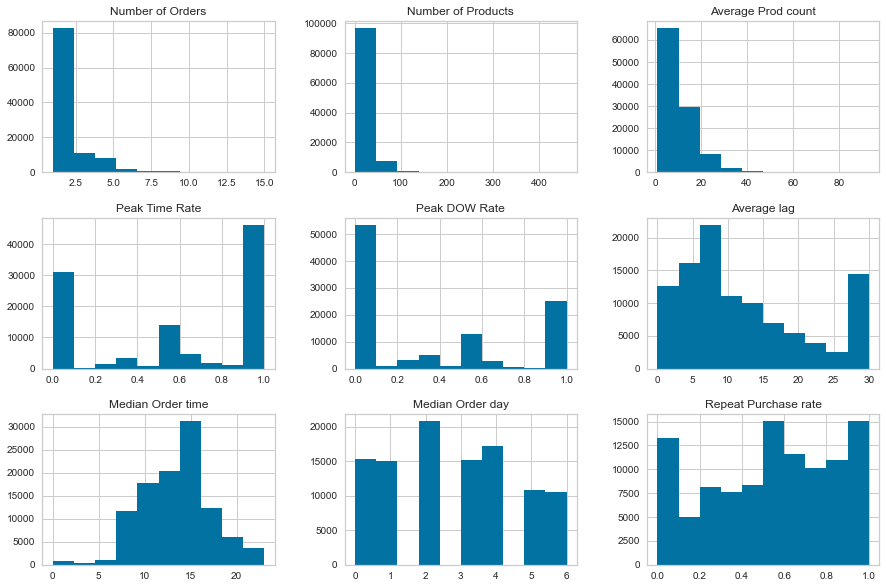

In [471]:
#Plot-distribution of all the features
feat.hist(figsize=(15, 10))


It can be observed that `Number of Orders`,`Number of Products` and `Average Prod Count` is skewed positively. To transform the skewed data to approximately conform to normality,Log Transformation should be done

In [472]:
feat.columns

Index(['Number of Orders', 'Number of Products', 'Average Prod count',
       'Peak Time Rate', 'Peak DOW Rate', 'Average lag', 'Median Order time',
       'Median Order day', 'Repeat Purchase rate'],
      dtype='object')

In [473]:
# Log-transformation -Number of Orders,Number of Products and Average Prod Count
feat[['Number of Orders','Number of Products','Average Prod count']] = np.log(feat[['Number of Orders','Number of Products','Average Prod count']])

array([[<AxesSubplot:title={'center':'Number of Orders'}>,
        <AxesSubplot:title={'center':'Number of Products'}>,
        <AxesSubplot:title={'center':'Average Prod count'}>],
       [<AxesSubplot:title={'center':'Peak Time Rate'}>,
        <AxesSubplot:title={'center':'Peak DOW Rate'}>,
        <AxesSubplot:title={'center':'Average lag'}>],
       [<AxesSubplot:title={'center':'Median Order time'}>,
        <AxesSubplot:title={'center':'Median Order day'}>,
        <AxesSubplot:title={'center':'Repeat Purchase rate'}>]],
      dtype=object)

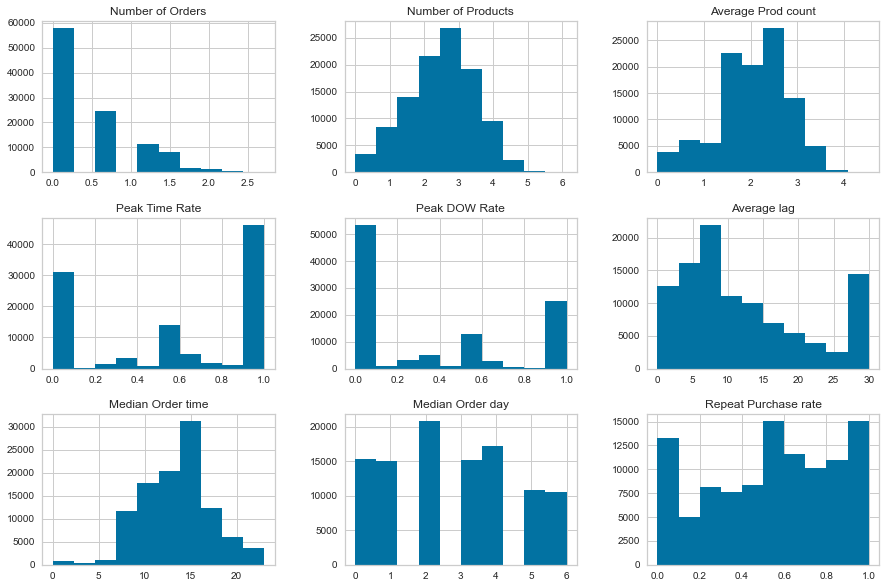

In [474]:
#distribution of the features after log transform
feat.hist(figsize=(15, 10))

By log transformation ,`Number of Products` and `Average Prod count` are slighty normalised.Standardisation of the features has to done to minimize the influence of outliers in K-means clustering. 

In [475]:
# Scaling the features
scaler = StandardScaler()
feat_scaled = scaler.fit_transform(feat)

In [476]:
# Convert to DataFrame and check summary stats
feat_scaled = pd.DataFrame(feat_scaled)
feat_scaled.describe()

,0,1,2,3,4,5,6,7,8
count,1.052730e+05,1.052730e+05,1.052730e+05,1.052730e+05,1.052730e+05,1.052730e+05,1.052730e+05,1.052730e+05,1.052730e+05
mean,6.430525e-16,5.530476e-16,-6.536025e-17,-3.814525e-15,-1.898443e-15,1.139689e-16,3.336353e-16,-9.699858e-16,1.499971e-16
std,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00
min,-8.028329e-01,-2.510603e+00,-2.633132e+00,-1.346659e+00,-8.525493e-01,-1.295825e+00,-3.593496e+00,-1.468116e+00,-1.723937e+00
25%,-8.028329e-01,-5.612146e-01,-5.664583e-01,-1.346659e+00,-8.525493e-01,-7.545240e-01,-6.712946e-01,-9.339535e-01,-7.599768e-01
50%,-8.028329e-01,5.893128e-02,3.707180e-02,2.168028e-01,-8.525493e-01,-3.214829e-01,1.256695e-01,1.343715e-01,1.075878e-01
75%,4.193951e-01,6.731318e-01,7.556725e-01,9.868661e-01,7.699839e-01,6.528597e-01,6.569789e-01,6.685340e-01,8.144922e-01
max,3.972278e+00,3.631584e+00,3.187164e+00,9.868661e-01,1.569142e+00,1.951983e+00,2.516562e+00,1.736859e+00,1.489265e+00


### PCA

The Explained variance in PCA should be 95-99%.So at first we assign n_components = 0.95.This will select the number of components while preserving 95% of the variability in the data. 

In [477]:
pca_95 = PCA(n_components=0.95,random_state=42)
df_pca_95 = pca_95.fit_transform(feat_scaled)

In [478]:
df_pca_95.shape

(105273, 7)

This means that the algorithm has found 7 principal components to preserve 95% of the variability in the data. The df_pca_95 array holds the values of all 10 principal components. We can visualize these values as in the following plot.

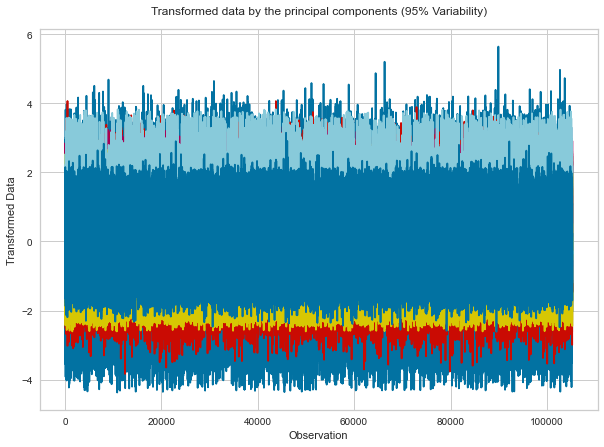

In [479]:
plt.figure(figsize=(10,7))
plt.plot(df_pca_95)
plt.xlabel('Observation')
plt.ylabel('Transformed Data')
plt.title('Transformed data by the principal components (95% Variability)',pad=15)
plt.show()

In [480]:
pca = PCA(n_components=7)
df_pca = pca.fit_transform(feat_scaled)
df_pca = pd.DataFrame(df_pca)
df_pca.head()

,0,1,2,3,4,5,6
0,0.045644,0.125018,0.685115,-1.184481,-0.949017,0.003385,0.335430
1,0.606623,-0.025438,-0.071191,1.850626,-0.030643,0.005963,1.076599
2,0.987726,2.169416,-1.700040,1.393048,2.231404,0.111871,-0.480435
3,0.879150,-0.662369,-1.644488,-0.962481,0.127251,-0.779012,-0.838711
4,-0.940244,-1.018090,-1.479290,-1.816315,1.088329,-0.118345,0.583690


### K-Means clustering 

Euclidean distance approach is used to calcuate the distances

In [481]:
#eucliean distance
Sum_of_squared_distances = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(df_pca)
    Sum_of_squared_distances.append(km.inertia_)

#### To Determine the Optimal value for K

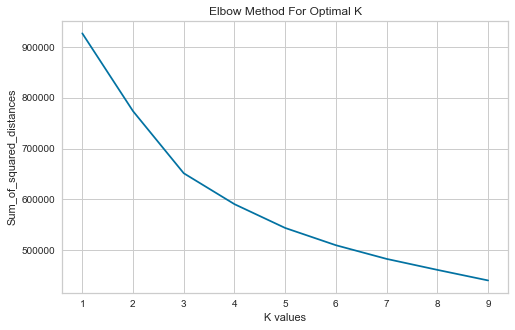

In [482]:
#### To Determine the Optimal value for K
plt.subplots(figsize = (8, 5))
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('K values')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal K')
plt.show()

K = 5 is selected based on the above plot

In [483]:
clust = KMeans(n_clusters=5,random_state=42).fit(df_pca)
centers = clust.cluster_centers_
c_preds = clust.predict(df_pca)
print(centers)

[[-0.52031481 -0.91060829 -0.95776643  1.56840413  0.02647417 -0.06639142
  -0.09571567]
 [-0.37137008 -0.94702247 -0.54468788 -0.89146071 -0.02898858  0.05905897
  -0.24146175]
 [-2.12833792 -0.07280048  1.10497988 -0.01488428  0.15939497 -0.00253219
   0.1392285 ]
 [ 0.07746799  2.00271693 -0.36212501 -0.04367808 -0.07169798  0.04406886
  -0.20452349]
 [ 1.53401965 -0.33353947  0.62654743  0.11431183 -0.00894836 -0.05476619
   0.34082993]]


In [484]:
temp_df = df_pca.iloc[:, 0:2]
temp_df.columns = ["pc1", "pc2"]
temp_df['cluster'] = c_preds
temp_df.head()

<ipython-input-484-dd20da319cba>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,pc1,pc2,cluster
0,0.045644,0.125018,1
1,0.606623,-0.025438,0
2,0.987726,2.169416,3
3,0.879150,-0.662369,1
4,-0.940244,-1.018090,1


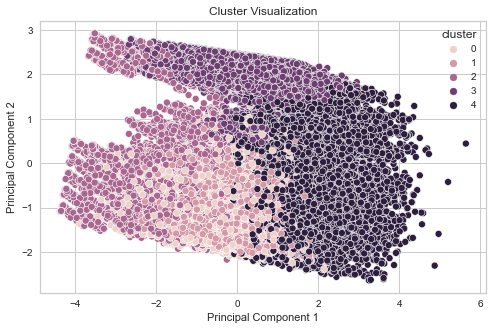

In [485]:
fig, ax = plt.subplots(figsize = (8, 5))
ax = sns.scatterplot(data = temp_df, x = "pc1", y = "pc2", hue = "cluster")
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_title("Cluster Visualization")
plt.show();

#### Remove the unwanted variables and repeat the process.
The variables that showed irregular distributions in the distribution plot and removed and same process is caried out once again.

In [486]:
# Drop features
new_feat = feat.drop(['Peak Time Rate', 'Peak DOW Rate','Repeat Purchase rate','Median Order time'], axis=1)

# Scale selected features
scaler = StandardScaler()
new_feat_scaled = scaler.fit_transform(new_feat)

# Convert to DataFrame
new_feat_scaled = pd.DataFrame(new_feat_scaled)
new_feat_scaled.describe()

,0,1,2,3,4
count,1.052730e+05,1.052730e+05,1.052730e+05,1.052730e+05,1.052730e+05
mean,6.430525e-16,5.530476e-16,-6.536025e-17,1.139689e-16,-9.699858e-16
std,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00
min,-8.028329e-01,-2.510603e+00,-2.633132e+00,-1.295825e+00,-1.468116e+00
25%,-8.028329e-01,-5.612146e-01,-5.664583e-01,-7.545240e-01,-9.339535e-01
50%,-8.028329e-01,5.893128e-02,3.707180e-02,-3.214829e-01,1.343715e-01
75%,4.193951e-01,6.731318e-01,7.556725e-01,6.528597e-01,6.685340e-01
max,3.972278e+00,3.631584e+00,3.187164e+00,1.951983e+00,1.736859e+00


In [487]:
#PCA
pca = PCA(n_components=2)
df_pca = pca.fit_transform(new_feat_scaled)
df_pca = pd.DataFrame(df_pca)
df_pca.head()

,0,1
0,0.059726,-0.846174
1,0.637378,-0.434211
2,0.544922,2.880155
3,1.121824,1.403288
4,-0.619535,1.603390


In [488]:
#Euclidean
Sum_of_squared_distances = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(df_pca)
    Sum_of_squared_distances.append(km.inertia_)

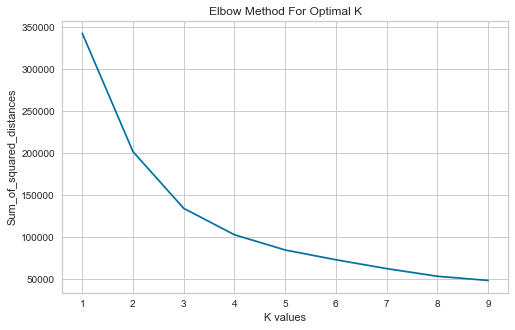

In [406]:
#to find the K value
plt.subplots(figsize = (8, 5))
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('K values')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal K')
plt.show()

K = 4 is selected based on the above plot

In [489]:
#Kmeans
clust = KMeans(n_clusters=4,random_state=42).fit(df_pca)
centers = clust.cluster_centers_
c_preds = clust.predict(df_pca)
print(centers)

[[-0.19341075 -0.43614979]
 [ 1.6921203  -0.40326072]
 [-0.10909253  1.38252297]
 [-2.25999561 -0.57333418]]


In [490]:
temp_df = df_pca.iloc[:, 0:2]
temp_df.columns = ["pc1", "pc2"]
temp_df['cluster'] = c_preds
temp_df.head()

<ipython-input-490-dd20da319cba>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,pc1,pc2,cluster
0,0.059726,-0.846174,0
1,0.637378,-0.434211,0
2,0.544922,2.880155,2
3,1.121824,1.403288,2
4,-0.619535,1.603390,2


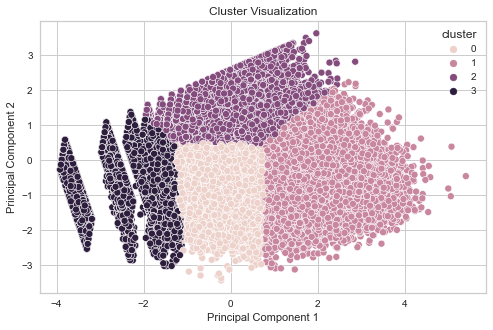

In [491]:
fig, ax = plt.subplots(figsize = (8, 5))
ax = sns.scatterplot(data = temp_df, x = "pc1", y = "pc2", hue = "cluster")
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_title("Cluster Visualization")
plt.show();

From the above visualisation plot, The clusters are most easily separable at k=4. Using the selected features,we can split customers into different groups based on their purchasing behavior.

####  K means is used in this business problem for the following reasons:

-Easily Scales to large data sets.

-Effortlessly adapts to any business case.

-Generalizes to clusters of different shapes and sizes.

In [492]:
#add the cluster variable to the original dataframe
feat['cluster'] = c_preds

cluster1 = feat[feat.cluster == 0]
cluster2 = feat[feat.cluster == 1]
cluster3 = feat[feat.cluster == 2]
cluster4 = feat[feat.cluster == 3]

In [493]:
feat.head()

,Number of Orders,Number of Products,Average Prod count,Peak Time Rate,Peak DOW Rate,Average lag,Median Order time,Median Order day,Repeat Purchase rate,cluster
user_id,,,,,,,,,,
2,0.693147,2.397895,1.791759,1.0,0.50,6.0,10.0,3.0,0.36,0
3,1.098612,2.944439,1.791759,0.0,0.33,13.0,18.0,2.0,0.47,0
7,0.000000,3.178054,3.178054,0.0,1.00,30.0,18.0,0.0,0.83,2
10,0.000000,3.401197,3.401197,1.0,0.00,14.0,15.0,3.0,0.43,2
11,0.000000,2.397895,2.397895,1.0,0.00,30.0,11.0,5.0,0.27,2


#### Snake plot 

We visualize the segments using snake plots for each cluster. we can plot the means of the profiled variables for each of our clusters to better visualize differences between segments. For better visualization we plot the standardized profiling variables.

In [495]:
# Reshape data for snake plot
cluster_melt = pd.melt(feat.reset_index(),
                       id_vars=['user_id', 'cluster'],
                       value_vars=['Number of Orders', 
                                   'Number of Products', 
                                   'Average Prod count','Average lag','Median Order day'],
                       var_name='Metric',
                       value_name='Value')

In [496]:
cluster_melt.head()

,user_id,cluster,Metric,Value
0,2,0,Number of Orders,0.693147
1,3,0,Number of Orders,1.098612
2,7,2,Number of Orders,0.000000
3,10,2,Number of Orders,0.000000
4,11,2,Number of Orders,0.000000


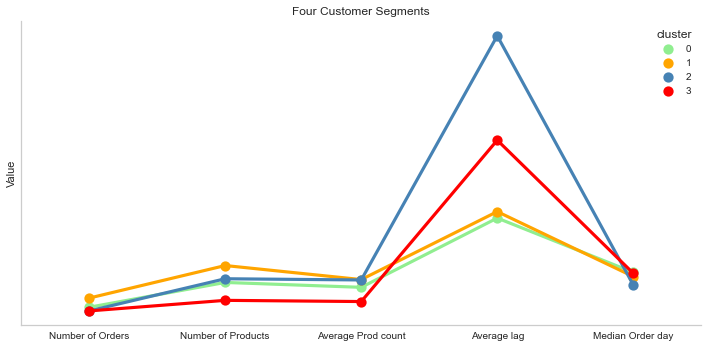

In [498]:
# Create snake plot
palette = ['lightgreen', 'orange', 'steelblue','red']
plt.figure(figsize=(10,5))
sns.pointplot(x='Metric', y='Value', data=cluster_melt, hue='cluster', 
              palette=palette)
plt.xlabel('')
plt.ylabel('Value')
plt.yticks([])
plt.title('Four Customer Segments')
sns.despine()
plt.tight_layout()
plt.show();

From the above snake plot,we can see the profiled variables and their respective mean values.Note that cluster 0(green) is group 1,cluster 1(orange) is group 2,Cluster 2(blue) is group 3 and Cluster 3(red) is group 4.These groups can be defined individually seperately.The information obtained from the snake plot is cross checked and interpreted accordingly.

In [429]:
#information about cluster group 1
cluster1.describe()

,Number of Orders,Number of Products,Average Prod count,Peak Time Rate,Peak DOW Rate,Average lag,Median Order time,Median Order day,Repeat Purchase rate,cluster
count,33067.000000,33067.000000,33067.000000,33067.000000,33067.000000,33067.000000,33067.000000,33067.000000,33067.000000,33067.0
mean,0.379101,2.307298,1.927772,0.571177,0.283699,7.314150,13.588169,3.090846,0.493737,0.0
std,0.449903,0.389652,0.465296,0.434859,0.389816,5.533763,3.799215,1.836025,0.323766,0.0
min,0.000000,1.609438,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,0.000000,1.945910,1.609438,0.000000,0.000000,3.000000,11.000000,2.000000,0.220000,0.0
50%,0.000000,2.302585,1.945910,0.600000,0.000000,7.000000,14.000000,3.000000,0.500000,0.0
75%,0.693147,2.639057,2.197225,1.000000,0.500000,10.000000,16.000000,5.000000,0.770000,0.0
max,2.197225,3.218876,3.044522,1.000000,1.000000,30.000000,23.000000,6.000000,1.000000,0.0


### Cluster Group-1:<br>
    
#### Analysis:
        -These customers are second most attractive segment after Loyal customers.Can be termed as 'Impulse Customers'
        -Average Lag between the orders is less when compared to other groups .ie.Mostly weekly-once purchasers.
        -These customers have high Reorder percentage when compared to other groups.
##### Suggestion:
         -send Weekend offer messages or email on selected products based on their frequent purchases to these customers can make them order on peak days as well.
         -Keeping these customers in the loop on new product offerings goes a long way in improving a company’s                      profitability.

In [430]:
#information about cluster group 2
cluster2.describe()

,Number of Orders,Number of Products,Average Prod count,Peak Time Rate,Peak DOW Rate,Average lag,Median Order time,Median Order day,Repeat Purchase rate,cluster
count,28665.000000,28665.000000,28665.000000,28665.000000,28665.000000,28665.000000,28665.000000,28665.000000,28665.000000,28665.0
mean,1.092437,3.622256,2.529976,0.574801,0.348495,7.816082,13.419955,2.766196,0.615999,1.0
std,0.496047,0.464395,0.481926,0.329425,0.310841,4.795927,3.173767,1.664518,0.238069,0.0
min,0.000000,2.639057,0.693147,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,0.693147,3.258097,2.197225,0.333300,0.000000,4.000000,11.000000,2.000000,0.480000,1.0
50%,1.098612,3.555348,2.484907,0.500000,0.330000,7.000000,14.000000,3.000000,0.660000,1.0
75%,1.386294,3.912023,2.890372,1.000000,0.500000,10.000000,16.000000,4.000000,0.800000,1.0
max,2.708050,6.131226,4.532599,1.000000,1.000000,30.000000,23.000000,6.000000,1.000000,1.0


### Cluster Group-2:<br>
    
#### Analysis:
        -Looking at the order and products counts,we can say that these customers generate the large portion of sales.Can          be termed as 'Loyal Customers'
        -Average Lag between the orders is less when compared to other groups .ie.Mostly weekly-once purchasers.
        -These customers are less likely to purchase on peak day of the weekday i.e Weekends.
##### Suggestion:
         -Just like group 1,sending Weekend offer messages on selected products based on their frequent purchases to these            customers can make them order on peak days as well.
         -These customers recommend the company’s products to other people.It is important to solicit their input and                 feedback and involve them in a company’s decision-making process.
         -Heavy emphasis should be placed on loyal customers in order to increase the business value.
         

In [431]:
#information about cluster group 3
cluster3.describe()

,Number of Orders,Number of Products,Average Prod count,Peak Time Rate,Peak DOW Rate,Average lag,Median Order time,Median Order day,Repeat Purchase rate,cluster
count,26113.000000,26113.000000,26113.000000,26113.000000,26113.000000,26113.000000,26113.000000,26113.000000,26113.000000,26113.0
mean,0.095000,2.594860,2.500097,0.584919,0.486673,21.488607,13.613181,2.114541,0.494574,2.0
std,0.242321,0.535482,0.504107,0.477561,0.483964,8.326942,4.071416,1.926364,0.274478,0.0
min,0.000000,1.386294,1.098612,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.0
25%,0.000000,2.197225,2.079442,0.000000,0.000000,14.000000,11.000000,0.000000,0.280000,2.0
50%,0.000000,2.639057,2.484907,1.000000,0.500000,23.000000,14.000000,2.000000,0.500000,2.0
75%,0.000000,2.995732,2.833213,1.000000,1.000000,30.000000,16.000000,4.000000,0.710000,2.0
max,1.098612,4.836282,4.304065,1.000000,1.000000,30.000000,23.000000,6.000000,1.000000,2.0


### Cluster Group-3:<br>
    
#### Analysis:
        -Looking at the above information,These customers can be termed as 'Need-based Customers' 
        -Average Lag between the orders very high .ie.Not so frequent buyers.
        -Though the average lag is high the product count information says that they buy only if they need something.
        -These group dont have a habit of buying produce department products.These products require frquent purchases as the shelf life period is less.

##### Suggestion:
         -Special discounts and offers should be provided to essential goods to make these group buy ferquently.
         -Omnichannel marketing can greatly improve conversions.Incorporate live chat and chattbots on the website that lets communicate with these customers in real-time

In [432]:
#information about cluster group 4
cluster4.describe()

,Number of Orders,Number of Products,Average Prod count,Peak Time Rate,Peak DOW Rate,Average lag,Median Order time,Median Order day,Repeat Purchase rate,cluster
count,17428.000000,17428.000000,17428.000000,17428.000000,17428.000000,17428.000000,17428.000000,17428.000000,17428.000000,17428.0
mean,0.091790,0.914630,0.821518,0.580154,0.285856,13.371127,13.457540,3.019394,0.549800,3.0
std,0.246346,0.527180,0.519476,0.479296,0.437523,10.408921,4.094242,1.938893,0.404236,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0
25%,0.000000,0.693147,0.693147,0.000000,0.000000,5.000000,10.000000,1.000000,0.000000,3.0
50%,0.000000,1.098612,0.693147,1.000000,0.000000,11.000000,13.000000,3.000000,0.600000,3.0
75%,0.000000,1.386294,1.386294,1.000000,1.000000,22.000000,16.000000,5.000000,1.000000,3.0
max,1.386294,1.791759,1.791759,1.000000,1.000000,30.000000,23.000000,6.000000,1.000000,3.0


### Cluster Group-4:<br>
    
#### Analysis:
        -Looking at the above information,These customers can be termed as 'Wandering Customers' and they make up the smallest percentage of sales revenue.
        -Average Lag between the orders is high .ie.Not so frequent buyers.
        -Inspite of being Non so frequent buyers,Unlike Group 3 customers,These group customers order products in very less quantity.

##### Suggestion:
         -Create the sense of urgency by offering the short-term discount or incentive.
         -Provide insightful information about products to these customers can stimulate interest.
         -Follow an impactful content marketing strategy-Create blog posts, tips, videos and infographics related to the products that the business sell.

# 5.Additional Analysis/initiatives

### Customer Journey

This analysis is about the  customer product purchases in sequencial order.The first ,second and third purchase of the products are analysed in the subsequent steps

In [499]:
df1 = df1.sort_values(by=['order_id'],ascending=True)
df2 = df1

The rank measure is used here to find the unique and consecutive orders for every user/customer

In [500]:
#Include the Rank "R" in the dataframe
df2["R"] = df2.groupby('user_id')['order_id'].rank(method="dense", ascending=True)

In [501]:
df2.head(100)

,user_id,order_id,product_id,department_id,add_to_cart_order,reordered,product_name,department,order_number,order_dow,order_hour_of_day,days_since_prior_order,Time Period,ordered,R
0,135442,10,24,4,1,1,fresh fruits,produce,4,6,8,8.0,Morning,0,1.0
14,135442,10,92,18,8,1,baby food formula,babies,4,6,8,8.0,Morning,0,1.0
12,135442,10,16,4,3,0,fresh herbs,produce,4,6,8,8.0,Morning,1,1.0
11,135442,10,24,4,4,1,fresh fruits,produce,4,6,8,8.0,Morning,0,1.0
10,135442,10,83,4,5,1,fresh vegetables,produce,4,6,8,8.0,Morning,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92,181484,147,104,13,6,0,spices seasonings,pantry,16,0,12,20.0,Morning,1,1.0
91,181484,147,91,16,1,1,soy lactosefree,dairy eggs,16,0,12,20.0,Morning,0,1.0
89,181484,147,83,4,3,0,fresh vegetables,produce,16,0,12,20.0,Morning,1,1.0
88,181484,147,17,13,7,0,baking ingredients,pantry,16,0,12,20.0,Morning,1,1.0


In [502]:
rr = df2.groupby('R')['user_id'].nunique()
rr = pd.DataFrame(rr)

In [503]:
rr

,user_id
R,
1.0,105273
2.0,47470
3.0,22784
4.0,11603
5.0,6159
6.0,3323
7.0,1746
8.0,884
9.0,446


#### Purchases on products

In [504]:
#First purchase
FPR = df2[df2['R']==1].groupby('product_name').count().sort_values(by=['order_id'],ascending  = False)
FPR = FPR['order_id']
FPR = pd.DataFrame(FPR)
FPR.head()

,order_id
product_name,
fresh fruits,114304
fresh vegetables,112348
packaged vegetables fruits,57046
yogurt,45912
packaged cheese,32723


In [505]:
#Second purchase
SPR = df2[df2['R']==2].groupby('product_name').count().sort_values(by=['order_id'],ascending  = False)
SPR = SPR['order_id']
SPR = pd.DataFrame(SPR)
SPR.head()

,order_id
product_name,
fresh fruits,54665
fresh vegetables,50620
packaged vegetables fruits,26388
yogurt,21729
packaged cheese,14680


In [506]:
#Third purchase
TPR = df2[df2['R']==3].groupby('product_name').count().sort_values(by=['order_id'],ascending  = False)
TPR = TPR['order_id']
TPR = pd.DataFrame(TPR)
TPR.head()

,order_id
product_name,
fresh fruits,27522
fresh vegetables,24365
packaged vegetables fruits,12851
yogurt,10848
packaged cheese,6943


In [507]:
#merging the tables-first, second and third purchase
df_c = FPR.merge(SPR, left_on='product_name', right_on='product_name')
df_c = df_c.merge(TPR, left_on='product_name', right_on='product_name')

In [508]:
df_c = pd.DataFrame(df_c)
df_c = df_c.reset_index()

In [509]:
#only high purchases purchased products are considered 
df_c1 = df_c.head(5)
df_c1 = df_c1.T

df_c1.rename(columns = {0:'fresh fruits',1: 'fresh vegetables',2:'packaged vegetables fruits',3:'yogurt',4:'packaged cheese'}, inplace = True)

df_c1 = df_c1.drop(df_c1.index[range(1)])

In [510]:
df_c1['ind'] = [1,2,3]

<AxesSubplot:title={'center':'Product Purchase Behaviour'}, xlabel='ind'>

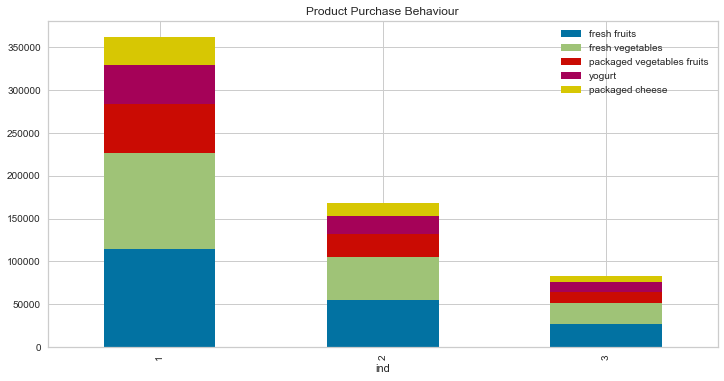

In [511]:
df_c1.plot.bar(x='ind', stacked=True, title='Product Purchase Behaviour')

The contribution of different products during 1st , 2nd and 3rd purchases are identical.So,We can observe the repeated customer behaviour does not change over time/over purchases.Hence we should look at quantity and revenue perspective of the products to determine the patterns.

#### Purchases with respect to department

In [512]:
#First purchase
FPR = df2[df2['R']==1].groupby('department').count().sort_values(by=['order_id'],ascending  = False)
FPR = FPR['order_id']
FPR = pd.DataFrame(FPR)
FPR.head()

,order_id
department,
produce,305408
dairy eggs,173421
snacks,93981
beverages,87762
frozen,76647


In [513]:
#Second purchase
SPR = df2[df2['R']==2].groupby('department').count().sort_values(by=['order_id'],ascending  = False)
SPR = SPR['order_id']
SPR = pd.DataFrame(SPR)
SPR.head()

,order_id
department,
produce,141295
dairy eggs,80482
snacks,43499
beverages,40262
frozen,33313


In [514]:
#Third purchase
TPR = df2[df2['R']==3].groupby('department').count().sort_values(by=['order_id'],ascending  = False)
TPR = TPR['order_id']
TPR = pd.DataFrame(TPR)
TPR.head()

,order_id
department,
produce,69388
dairy eggs,39637
snacks,21023
beverages,19575
frozen,15015


In [515]:
#merging the tables
df_c = FPR.merge(SPR, left_on='department', right_on='department')
df_c = df_c.merge(TPR, left_on='department', right_on='department')

In [516]:
df_c = pd.DataFrame(df_c)
df_c = df_c.reset_index()

In [517]:
pd.options.display.max_rows = 999
df_c

,department,order_id_x,order_id_y,order_id
0,produce,305408,141295,69388
1,dairy eggs,173421,80482,39637
2,snacks,93981,43499,21023
3,beverages,87762,40262,19575
4,frozen,76647,33313,15015
5,pantry,62458,27620,13043
6,bakery,38225,17397,8369
7,canned goods,36439,15547,7154
8,deli,34459,15562,7455
9,dry goods pasta,29649,12718,5935


In [518]:
df_c1 = df_c.head(5)
df_c1 = df_c1.T

df_c1.rename(columns = {0:'produce',1: 'dairy eggs',2:'snacks',3:'beverages',4:'frozen'}, inplace = True)

df_c1 = df_c1.drop(df_c1.index[range(1)])

In [519]:
df_c1['ind'] = [1,2,3]

<AxesSubplot:title={'center':'Department Purchase Behaviour'}, xlabel='ind'>

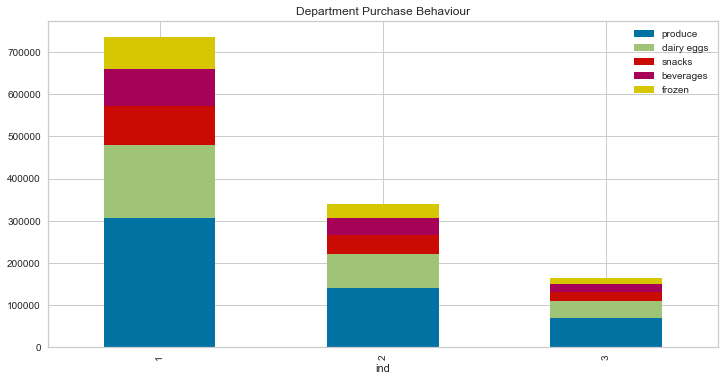

In [520]:
df_c1.plot.bar(x='ind', stacked=True, title='Department Purchase Behaviour')

Similarly,The contribution of different departments during 1st , 2nd and 3rd purchases are identical.So,We can observe the repeated customer behaviour does not change over time/over purchases.Hence we should look at quantity and revenue perspective of the department to determine the patterns.

In the similar fashion,the unique and consecutive orders for any user with respect to other variables can be analysed.This will be useful for the business to find the trends and patterns 

# Task 2 

<b>Objective : 
As a Lead E-commerce Data Scientist,the main objective is to to develop ideas that revolve around using big data and data science within eCommerce to boost online sales.

## What use cases do you have in mind to solve that problem?

- The use of Virtual Reality(VR) by auto dealers will enhance the car-shopping experience by allowing the consumers to epxlore a range of models,colors and trim levels in an interactive way.

- Using VR, Customers can conduct virtual walkarounds by spinning a vehicle 360 degrees to view it from all angles and even experience what it’s like to be in the driver’s seat. Customers can explore vehicles and options for as long as they want and interact with vehicles that are not available at the dealership itself – anywhere they have a VR headset available, whether in the showroom or at home.

- Potential customers can view the complete inventory the dealer features in a virtual library using the VR headset, even if the vehicle needs to be special-ordered. This allows customers to bypass the time-consuming and sometimes stressful process of visiting a dealership, provides them more options and helps solidify their choice before ever entering a showroom or talking to a salesperson.

- As most of the customers consider speed and convenience to be important factors in good customer service, the power of VR can be used to make informed decisions and streamline their online-buying(E-commerce) processes

## What kind of data do you need?

- Consumer Surveying Data and consumer behavioural data(eye tracking)


- During the shopping process, we can gather better data using eye-tracking technology that is built into the VR headsets in a manner that does not interrupt the shopping experience. The resulting analytics provide detailed insights into actual consumer behavior,such as which products attract their attention, where they look first or gaze longest, and what helps to trigger buying decisions.<br>


- Additionally Consumer Surveying Data can be collected digitally.This is to target customers' behavioral patterns to determine the best way to meet their needs.Additionally, Analysing this data allows us to refine the marketing to reach a very specific audience. 

## What are the limits/shortcomings of your ideas?

- Though it has many advantages,from an e-commerce perspective it remains difficult to implement on a broad scale.<br>


- Relatively High possibility of functionality issues may occur while Using VR